In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
nltk.download('wordnet')
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer, PorterStemmer
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import CountVectorizer
import wordninja
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import scattertext as st
from scattertext import CorpusFromPandas, produce_scattertext_explorer
from IPython.display import IFrame
from IPython.core.display import display, HTML

[nltk_data] Downloading package wordnet to /home/sanju/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [20]:
depression = pd.read_csv('./data/depression.csv')
suicide_watch = pd.read_csv('./data/suicide_watch.csv')

In [21]:
pd.set_option('display.max_columns', None)
depression.head()

,all_awardings,allow_live_comments,approved_at_utc,approved_by,archived,author,author_cakeday,author_flair_background_color,author_flair_css_class,author_flair_richtext,author_flair_template_id,author_flair_text,author_flair_text_color,author_flair_type,author_fullname,author_patreon_flair,author_premium,awarders,banned_at_utc,banned_by,can_gild,can_mod_post,category,clicked,content_categories,contest_mode,created,created_utc,discussion_type,distinguished,domain,downs,edited,gilded,gildings,hidden,hide_score,id,is_created_from_ads_ui,is_crosspostable,is_meta,is_original_content,is_reddit_media_domain,is_robot_indexable,is_self,is_video,likes,link_flair_background_color,link_flair_css_class,link_flair_richtext,link_flair_text,link_flair_text_color,link_flair_type,locked,media,media_embed,media_only,mod_note,mod_reason_by,mod_reason_title,mod_reports,name,no_follow,num_comments,num_crossposts,num_reports,over_18,parent_whitelist_status,permalink,pinned,pwls,quarantine,removal_reason,removed_by,removed_by_category,report_reasons,saved,score,secure_media,secure_media_embed,selftext,selftext_html,send_replies,spoiler,stickied,subreddit,subreddit_id,subreddit_name_prefixed,subreddit_subscribers,subreddit_type,suggested_sort,thumbnail,title,top_awarded_type,total_awards_received,treatment_tags,ups,upvote_ratio,url,user_reports,view_count,visited,whitelist_status,wls,is_suicide
0,"[{'giver_coin_reward': None, 'subreddit_id': None, 'is_new': False, 'days_of_drip_extension': 0, 'coin_price': 300, 'id': 'award_68ba1ee3-9baf-4252-be52-b808c1e8bdc4', 'penny_donate': None, 'award_sub_type': 'GROUP', 'coin_reward': 250, 'icon_url': 'https://i.redd.it/award_images/t5_22cerq/vu6om0xnb7e41_This.png', 'days_of_premium': 0, 'tiers_by_required_awardings': {'0': {'resized_icons': [{'url': 'https://preview.redd.it/award_images/t5_22cerq/vu6om0xnb7e41_This.png?width=16&amp;height=16&amp;auto=webp&amp;s=9c0a85437357b987e50ba727b67fcc53b0950c95', 'width': 16, 'height': 16}, {'url': 'https://preview.redd.it/award_images/t5_22cerq/vu6om0xnb7e41_This.png?width=32&amp;height=32&amp;auto=webp&amp;s=773692cd146e84fddcc3d192b6ebb7e0ff8fa8bb', 'width': 32, 'height': 32}, {'url': 'https://preview.redd.it/award_images/t5_22cerq/vu6om0xnb7e41_This.png?width=48&amp;height=48&amp;auto=webp&amp;s=597adeb2d7ab45cc61a726b7c7d6877d264ee33d', 'width': 48, 'height': 48}, {'url': 'https://previe...",True,NaN,NaN,True,SQLwitch,NaN,NaN,NaN,[],NaN,NaN,NaN,text,t2_1t70,False,True,[],NaN,NaN,False,False,NaN,False,NaN,False,1.572390e+09,1.572361e+09,NaN,moderator,self.depression,0,False,1,"{'gid_1': 17, 'gid_2': 1}",False,False,doqwow,False,False,False,False,False,True,True,False,NaN,NaN,NaN,[],NaN,dark,text,False,NaN,{},False,NaN,NaN,NaN,[],t3_doqwow,False,175,2,NaN,False,no_ads,/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,False,0.0,False,NaN,NaN,NaN,NaN,False,2320,NaN,{},"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...","&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt;p&gt;We understand that most people who reply im

In [22]:
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head()

,title,selftext,author,num_comments,is_suicide,url
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",SQLwitch,175,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/
1,"Regular Check-In Post, with important reminders about the No Private Contact and No Activism rules","Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us. \n\n********\n\n**Please keep in mind that no activism, i.e. advocating or fundraising for social change or raising awareness of social issues, is ever allowed here.** \n\nIt's not that we're against activism. We're strongly in favour of it. But we've learned the hard way that it doesn't work within a dedicated support space, so with re...",SQLwitch,1984,0,https://www.reddit.com/r/depression/comments/m246c4/regular_checkin_post_with_important_reminders/
2,I just tried to kill myself and my family didn't give a fuck.,"I tried to hang myself and it happened like this, first i lost conscious, then later in the mid of it i woke up somehow and pulled my head off the rope ( i wasnt using an actual rope)as fast as i could , when i fell down i was feeling so dizzy and in pain, i went to my bed and my neck was red and i started screaming out of pain, so my mother comes to see whats up and when she sees my red neck she starts to call the rest of my family and then she starts to curse me and hit me on the head, and my brother was just laughing like it was nothing,\nAnd my father was just staring at me in disgust, none of them tried to ask me if im ok or if they did something wrong to me, im lonely, i have none to talk to, and i have no friend , and i feel like just one hug would take all my pain away. But the fact that nobody is there for me makes me in more pain.\n\nPlease help me.",untitled_HumanBeing,27,0,https://www.reddit.com/r/depression/comments/odjwkt/i_just_tried_to_kill_myself_and_my_family_didnt/
3,my body feels like i'm 80,i'm in my 30s but my body feels like im 80. it's so weak and fragile. it feels like i aged 50yrs in last few yrs,elaapvy,10,0,https://www.reddit.com/r/depression/comments/odir54/my_body_feels_like_im_80/
4,Nsfw : I only have two moods,"1) I want to have sex.\n2) I want to die\n\nEDIT: didn't expect this post to blow up. Had a few msgs assuming I am male for some reason. I'm 

In [23]:
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head()

,title,selftext,author,num_comments,is_suicide,url
0,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate everyone who gives responsive, empathetic, non-judgemental support to our OPs, and we particularly thank everyone who's already been...",SQLwitch,253,1,https://www.reddit.com/r/SuicideWatch/comments/cz6nfd/new_wiki_on_how_to_avoid_accidentally_encouraging/
1,Please remember that NO ACTIVISM of any kind is allowed here. Not today or any day.,"Activism, i.e. advocating or fundraising for social change or raising awareness of social issues (and suicide *is*, inescapably, a social issue) is absolutely against the rules here at all times. \n\nPlease understand that we're all for well-informed, strategically-savvy activism. It's essential in the fight against stigma, misinformation, and discrimination, and the fight for research, treatment, accommodation, acceptance, and understanding. Most of us, one way or another, are mental-health activists IRL. \n\nBut activism just doesn't work in a dedicated support space that serves a vulnerable population. We used to allow it, until the evidence that it was undermining our primary purpose became overwhelming, and, not without regret, we made this rule. Our population is all too well aware of the issues and causes that need support and largely not in a position to take action, so besides the fact that activism is often salt in our members' wounds, it's a waste of the activists'...",SQLwitch,116,1,https://www.reddit.com/r/SuicideWatch/comments/iq0w21/please_remember_that_no_activism_of_any_kind_is/
2,"Hey there, I love you 🤍",I really wish I could hug all of you that are hurting right now and take your pain away. I understand how you feel and always remember that there’s one person out here that cares for you whole heartedly. ❤️,Alternative-Lime1452,18,1,https://www.reddit.com/r/SuicideWatch/comments/odi43y/hey_there_i_love_you/
3,Is there a way just to die in your sleep?,"I can't take this shit anymore. I just want to die in my sleep. I don't want to overdose, hang myself, fall off a building or other painful ways. Man i just don't want to wake up anymore.",PewDiePie610,27,1,https://www.reddit.com/r/SuicideWatch/comments/odhmlv/is_there_a_way_just_to_die_in_your_sleep/
4,"Honest to God, what reason do I have to be alive?","Is it climate change? Is it the rising housing prices? Is it my worthless brain? Is it to pay bills, with money I don't have, from jobs I can't keep? Is it to be alone forever, each day growing further apart from my friends &amp; family? Is it watching my family grow older and older and dying and having to take care of them? Is it working for any reason and having your savings stolen by your parent? Is it living with repressed childhood trauma and untreated ADHD for my entire life? Is it constantly getting my hopes up about a job or college and then quitting after one week? Is it laying in bed wanting to just sleep until I'm dead?\n\nJesus H fucking Christ. No good comes from my being alive. It's JUST suffering. Never any happiness, never any success, never any connections with 

In [24]:
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape, suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

((984, 6), (982, 6))

## Choosing only the relevant columns

In [25]:
depression_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
suicide_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
#making combined data by combining depresssion data and suicide data
combined_data = pd.concat([depression_columns,suicide_columns],axis=0, ignore_index=True)    

In [26]:
combined_data.head()

,title,selftext,author,num_comments,is_suicide,url
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",SQLwitch,175,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/
1,"Regular Check-In Post, with important reminders about the No Private Contact and No Activism rules","Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us. \n\n********\n\n**Please keep in mind that no activism, i.e. advocating or fundraising for social change or raising awareness of social issues, is ever allowed here.** \n\nIt's not that we're against activism. We're strongly in favour of it. But we've learned the hard way that it doesn't work within a dedicated support space, so with re...",SQLwitch,1984,0,https://www.reddit.com/r/depression/comments/m246c4/regular_checkin_post_with_important_reminders/
2,I just tried to kill myself and my family didn't give a fuck.,"I tried to hang myself and it happened like this, first i lost conscious, then later in the mid of it i woke up somehow and pulled my head off the rope ( i wasnt using an actual rope)as fast as i could , when i fell down i was feeling so dizzy and in pain, i went to my bed and my neck was red and i started screaming out of pain, so my mother comes to see whats up and when she sees my red neck she starts to call the rest of my family and then she starts to curse me and hit me on the head, and my brother was just laughing like it was nothing,\nAnd my father was just staring at me in disgust, none of them tried to ask me if im ok or if they did something wrong to me, im lonely, i have none to talk to, and i have no friend , and i feel like just one hug would take all my pain away. But the fact that nobody is there for me makes me in more pain.\n\nPlease help me.",untitled_HumanBeing,27,0,https://www.reddit.com/r/depression/comments/odjwkt/i_just_tried_to_kill_myself_and_my_family_didnt/
3,my body feels like i'm 80,i'm in my 30s but my body feels like im 80. it's so weak and fragile. it feels like i aged 50yrs in last few yrs,elaapvy,10,0,https://www.reddit.com/r/depression/comments/odir54/my_body_feels_like_im_80/
4,Nsfw : I only have two moods,"1) I want to have sex.\n2) I want to die\n\nEDIT: didn't expect this post to blow up. Had a few msgs assuming I am male for some reason. I'm 

In [28]:
# here we can see thet the only null values are in the selftext column
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1966 entries, 0 to 1965
Data columns (total 6 columns):
title           1966 non-null object
selftext        1902 non-null object
author          1966 non-null object
num_comments    1966 non-null int64
is_suicide      1966 non-null int64
url             1966 non-null object
dtypes: int64(2), object(4)
memory usage: 92.2+ KB


In [29]:
# checking out the rows with NaN values
combined_data[combined_data['selftext'].isnull()].head()

,title,selftext,author,num_comments,is_suicide,url
996,I didn't ask to be born into this world of suffering. Why should I stay?,NaN,unstableginge,8,1,https://www.reddit.com/r/SuicideWatch/comments/odgfgd/i_didnt_ask_to_be_born_into_this_world_of/
998,I wonder if god or whoever put us here on this earth gave us this hardship of suicide and depression to try to fight in our lives and if he did well this shit is hard aff man it be up and down up and down this feeling will never go away the Void,NaN,Ok_Cranberry_576,1,1,https://www.reddit.com/r/SuicideWatch/comments/odin3p/i_wonder_if_god_or_whoever_put_us_here_on_this/
999,My panic attacks make me wish i was dead. I feel completely incapable to change my life. I feel i need to die. Ill hang myself at the end of this summer,NaN,jjeris,2,1,https://www.reddit.com/r/SuicideWatch/comments/odgqsg/my_panic_attacks_make_me_wish_i_was_dead_i_feel/
1006,I just want to sleep forever,NaN,fearguy22,4,1,https://www.reddit.com/r/SuicideWatch/comments/odd85i/i_just_want_to_sleep_forever/
1012,I just want to fucking die already,NaN,---iwtkms---,1,1,https://www.reddit.com/r/SuicideWatch/comments/odj9ls/i_just_want_to_fucking_die_already/


In [30]:
# 37 NaNs are from the r/SuicideWatch posts while 23 NaNs are from r/depression posts
combined_data['is_suicide'][combined_data['selftext'].isnull()].value_counts()

1    64
Name: is_suicide, dtype: int64

In [31]:
# for now replacing NaNs with emptypost
combined_data["selftext"].fillna("emptypost",inplace=True)

In [32]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1966 entries, 0 to 1965
Data columns (total 6 columns):
title           1966 non-null object
selftext        1966 non-null object
author          1966 non-null object
num_comments    1966 non-null int64
is_suicide      1966 non-null int64
url             1966 non-null object
dtypes: int64(2), object(4)
memory usage: 92.2+ KB


# Data pre-processing

The processing_text method will 
> **1**) convert the data into lower case.

>**2**) tokenize the data using RegexpTokenizer (r'(\w+)') is for selecting all the lower case digits.

>**3**) lemmatizing- for example is you give lemmatizer.lemmatize('pushing') the output will be 'push'.

>**4**) stopword removal-remove all the stopwords from the data.

>**5**) and finally it will join the words to form a string and append it to new_list.

In [33]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string)
        words_only_stem = [lemmatizer.lemmatize(i) for i in words_only]
        words_without_stop = [i for i in words_only_stem if i not in stopwords.words('english')]
        long_string_clean = ' '.join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [34]:
# adding setftext_clean and title_clean as cleaned versions of the selftext and title.
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])
combined_data["title_clean"] = processing_text(combined_data["title"])

In [35]:
# confirming is the new columns were added
pd.set_option("display.max_colwidth", 100)
combined_data.head(8)

,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",We understand that most people who reply immediately to an OP with an invitation to talk private...,SQLwitch,175,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,understand people reply immediately op invitation talk privately mean help type response usually...,broken least understood rule helper may invite private contact first resort made new wiki explain
1,"Regular Check-In Post, with important reminders about the No Private Contact and No Activism rules",Welcome to /r/depression's check-in post - a place to take a moment and share what is going on a...,SQLwitch,1984,0,https://www.reddit.com/r/depression/comments/m246c4/regular_checkin_post_with_important_reminders/,welcome r depression check post place take moment share going accomplishment want talk standalon...,regular check post important reminder private contact activism rule
2,I just tried to kill myself and my family didn't give a fuck.,"I tried to hang myself and it happened like this, first i lost conscious, then later in the mid ...",untitled_HumanBeing,27,0,https://www.reddit.com/r/depression/comments/odjwkt/i_just_tried_to_kill_myself_and_my_family_di...,tried hang happened like first lost conscious later mid woke somehow pulled head rope wasnt usin...,tried kill family give fuck
3,my body feels like i'm 80,i'm in my 30s but my body feels like im 80. it's so weak and fragile. it feels like i aged 50yrs...,elaapvy,10,0,https://www.reddit.com/r/depression/comments/odir54/my_body_feels_like_im_80/,30 body feel like im 80 weak fragile feel like aged 50yrs last yr,body feel like 80
4,Nsfw : I only have two moods,1) I want to have sex.\n2) I want to die\n\nEDIT: didn't expect this post to blow up. Had a few...,cherryboom0,141,0,https://www.reddit.com/r/depression/comments/od1l9g/nsfw_i_only_have_two_moods/,1 want sex 2 want die edit expect post blow msg assuming male reason female get horny depressed ...,nsfw two mood
5,Having your last hope of being happy again being shattered to million little pieces and actually...,"That's what has happened to me last week. And now it's more then a week that with depression, I ...",SirHenryCognac,8,0,https://www.reddit.com/r/depression/comments/odh3ep/having_your_last_hope_of_being_happy_again_b...,ha happened last week week depression also insomnia sleep something good happened wa exited slee...,last hope happy shattered million little piece actually become even depressed
6,Is it worth to keep on living like this?,I'm unintelligent and lack of creativeness other also think I'm stupid too. I'm isolated... I wi...,Revolutionary-Rub578,12,0,https://www.reddit.com/r/depression/comments/odhtac/is_it_worth_to_keep_on_living_like_this/,unintelligent lack creativeness also think stupid isolated wish wa born smart beyond bad luck ra...,worth keep living like
7,I remembered what it was like not to be depressed,"When I wasn't depressed I could walk into my home, work, or school and feel like I knew the peop...",Aviside,0,0,https://www.reddit.com/r/depression/comments/odit9m/i_remembered_what_it_was_like_not_to_be_depr...,depressed could walk home work school feel like knew people wa apart system felt valued recently...,remembered wa like depressed


In [36]:
#checking the difference between the previous columns and cleaned columns
pd.set_option("display.max_colwidth", 1000)
combined_data[["selftext","selftext_clean"]].head(2)

,selftext,selftext_clean
0,"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",understand people reply immediately op invitation talk privately mean help type response usually lead either disappointment disaster usually work quite differently say pm anytime casual social context huge admiration appreciation goodwill good citizenship many support others flag inappropriate content even know many struggling hard work behind scene information resource make easier give get quality help small start new wiki page explains detail much better respond public comment least gotten know someone maintained r depression wiki private_contact full text current version summary anyone acting helper invite accepts private contact e pm chat kind offsite communication early conversion showing either bad intention bad judgement either way unwise trust pm anytime seems like kind generous offer might perfectly well meaning unless solid rapport ha established wise idea point consider offer accept invitation communicate privately posting supportive reply publicly help people op respons...
1,"Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us. \n\n********\n\n**Please keep in mind that no activism, i.e. advocating or fundraising for social change or raising awareness of social issues, is ever allowed here.** \n\nIt's not that we're against activism. We're strongly in favour of it. But we've learned the hard way that it doesn't work within a dedicated support space, so with re...",welcome r depression check post place take moment share going accomplishment want talk standalone post sub violate role model rule welcome tough time prefer make post place share try best keep space safe supportive possible reddit wide open anonymity friendly platform community rule found sidebar community info official mobile apps sure rule please ask u please keep mind activism e advocating fundraising social change raising awareness social issue ever allowed activism strongly favour learned hard way work within dedicated support space regret allow thanks understanding please report fundraising awareness raising petition call participation post mainly cause issue rather request personal support despite fact always maintain sticky post still seeing lot violation private contact policy please read r depression wiki private_contact report violation see widespread disregard important rule cause trouble helper vulnerable ops waste time delay improvement making 

>There is a module called Word ninja on github, we have used that module here. It is very helpful in processing author names.For example- It takes as input 'liamisabossss' and outputs 'liam is a boss ss'.

In [37]:
## This is just for explanation, to understand thw working of Word Ninja
author_test = []
for i in range(10):
    splits_list = wordninja.split(combined_data['author'][i])
    combined_string = ' '.join(splits_list)
    author_test.append(combined_string)
test_dict = {combined_data["author"][i]:author_test[i] for i in range(10)}
print(test_dict)

{'SQLwitch': 'SQL witch', 'untitled_HumanBeing': 'untitled Human Being', 'elaapvy': 'el aap vy', 'cherryboom0': 'cherry boom 0', 'SirHenryCognac': 'Sir Henry Cognac', 'Revolutionary-Rub578': 'Revolutionary Rub 578', 'Aviside': 'Avi side', 'ellelae': 'elle lae', 'Neesay-san': 'Nee say san'}


>processing_author_names splits the author names like the previous cell and then applis tokenization, lemmatization, stopword removal and finally adds them to a new list.

In [38]:
def processing_author_names(series_to_process):
    author_split = []
    for i in range(len(series_to_process)):
        splits_list = wordninja.split(series_to_process[i])
        combined_string = " ".join(splits_list)
        author_split.append(combined_string)
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(author_split)):
        dirty_string = (author_split)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) 
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [39]:
# Adding author-clean as a cleaned version of author
combined_data["author_clean"]= processing_author_names(combined_data["author"])

In [40]:
# Checking the difference between author and author_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["author","author_clean"]].tail(10)

,author,author_clean
1956,Parking-Rain-6454,parking rain 6454
1957,iajzz,j zz
1958,KillAButterKnife,kill butter knife
1959,audranicolio,audra nico lio
1960,everythlngsucks_22,every th lng suck 22
1961,LemonandLimes2,lemon lime 2
1962,HumanSuit923,human suit 923
1963,r-ainskye,r skye
1964,doxielady228,xie lady 228
1965,TooTiredClown,tired clown


>Differentiating the r/SuicideWatch posts, titles and authors from ones from r/depression so that we can perform some EDA on them.

In [41]:
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]
suicide_authors = combined_data[combined_data["is_suicide"] ==1]["author_clean"]

depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]
depression_authors = combined_data[combined_data["is_suicide"] ==0]["author_clean"]

>We are making a function which will use WordCloud to show most commonly used words.We will also use a barplot to display the top words.


## Wordcloud explanation

> Wordcloud displays the most frequently used words and the size of the word is proportional to it's frequency.

> **1)** We will create a function plot_most_used_words().

> **2)** We will use CountVectorizer to get most frequent words and make a dataframe created_df which contains these most frequent words.

> **3)** We will extract top 40 words and sent it to dataframe.

> **4)** one_string() tekes a word from top_words_cloud_df and multiplies it by it's count i.e. by its frequency.

> **5)** we have given a png image as an input to the image_mask premimeter of our function. This image is converted to an array and the a wordcloud is created from it. The generate(long_string) method generates the Wordcloud from the long_string.

> **6)** Then we take the top 20 most frequent words and create a barplot from them.

In [42]:
#DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def plot_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING CVEC
    cvec = CountVectorizer(stop_words='english')
    cvec.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(cvec.transform(data_series).todense(),
                              columns=cvec.get_feature_names())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* top_words_cloud_df["count"][i]
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 1000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #image_colors = ImageColorGenerator(mask)
    #plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    #plt.axis("off")
    plt.figure(figsize = (20, 5), dpi=300)
    plt.title('\nTop Words used in {}\n'.format(category_string), fontsize=22)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

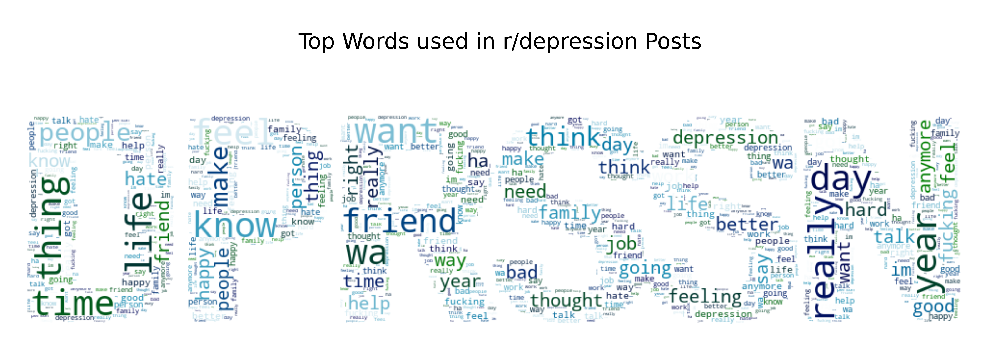

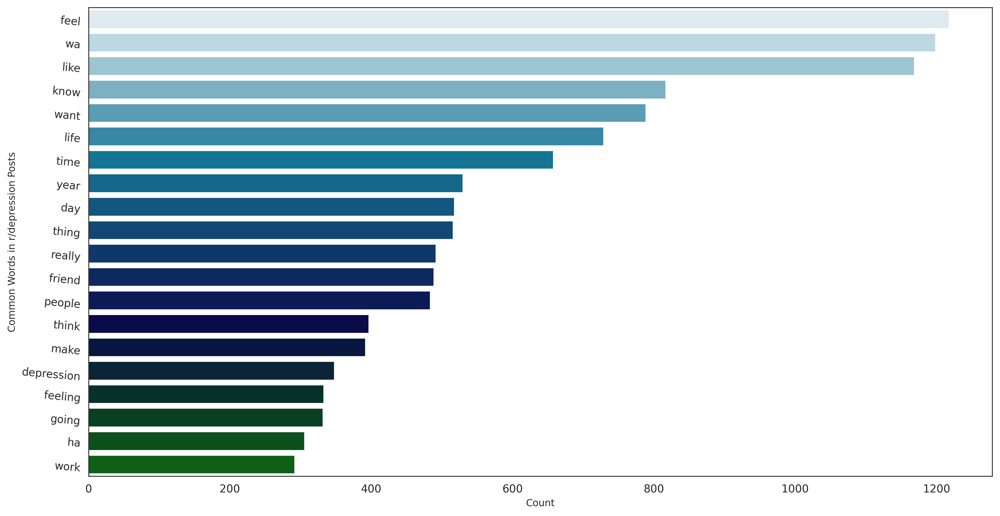

In [43]:
plot_most_used_words("r/depression Posts", depression_posts, palette="ocean_r", image_mask="./assets/depression_mask.png")

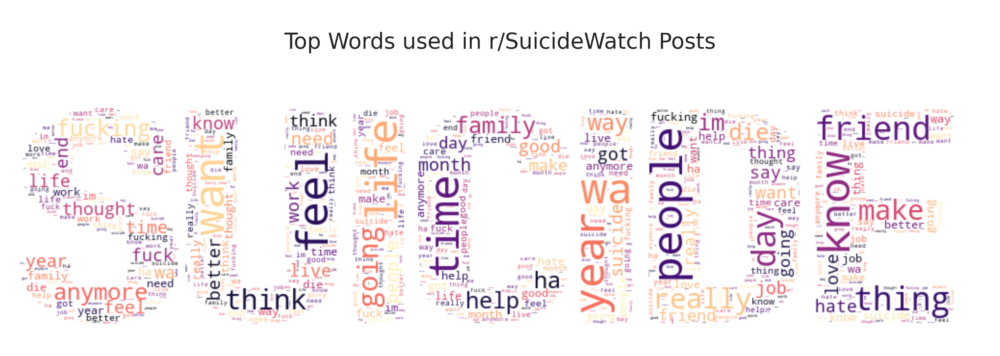

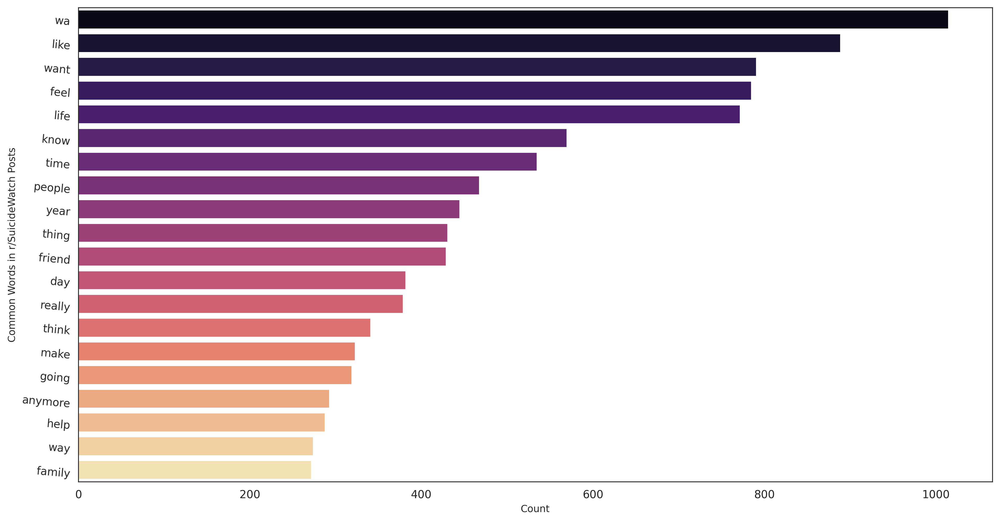

In [44]:
plot_most_used_words("r/SuicideWatch Posts", suicide_posts, palette="magma", image_mask="./assets/suicide_mask.png")

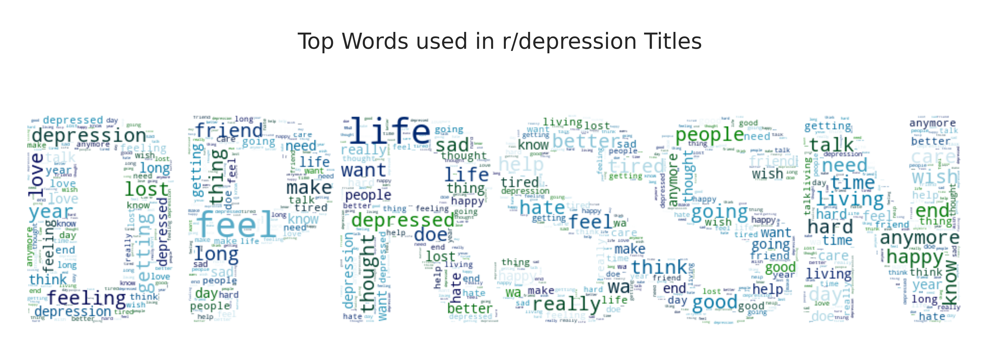

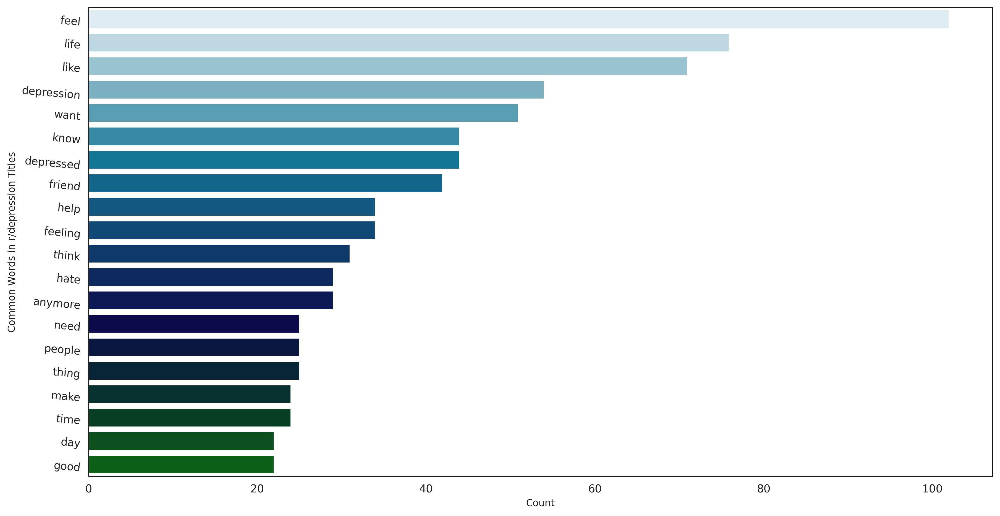

In [45]:
plot_most_used_words("r/depression Titles", depression_titles, palette="ocean_r", image_mask="./assets/depression_mask.png")

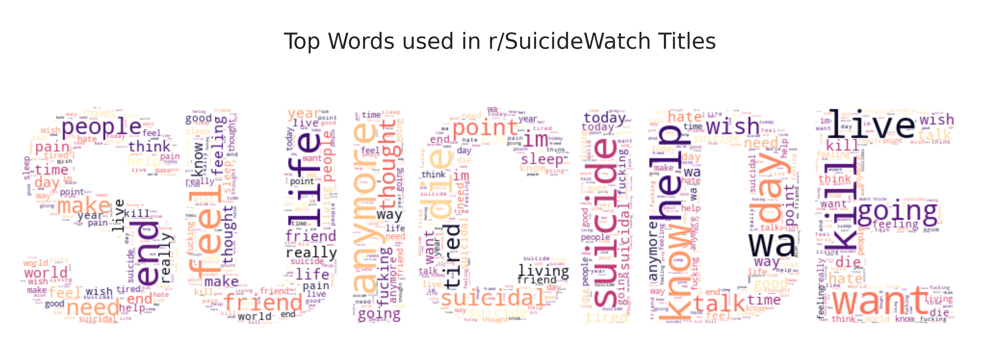

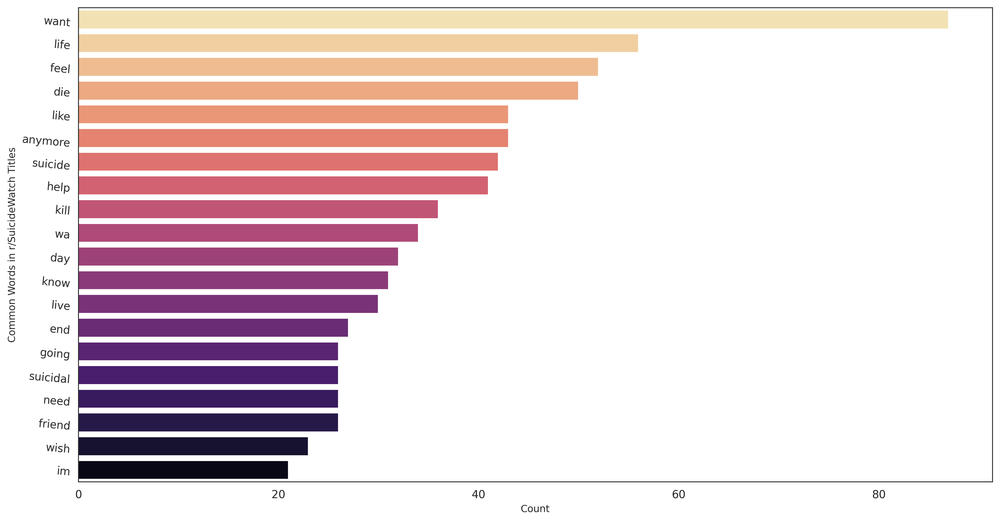

In [46]:
plot_most_used_words("r/SuicideWatch Titles", suicide_titles, palette="magma_r", image_mask="./assets/suicide_mask.png")

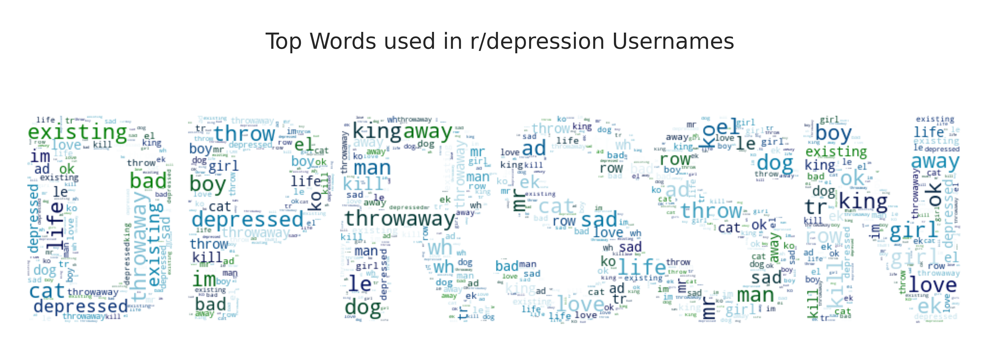

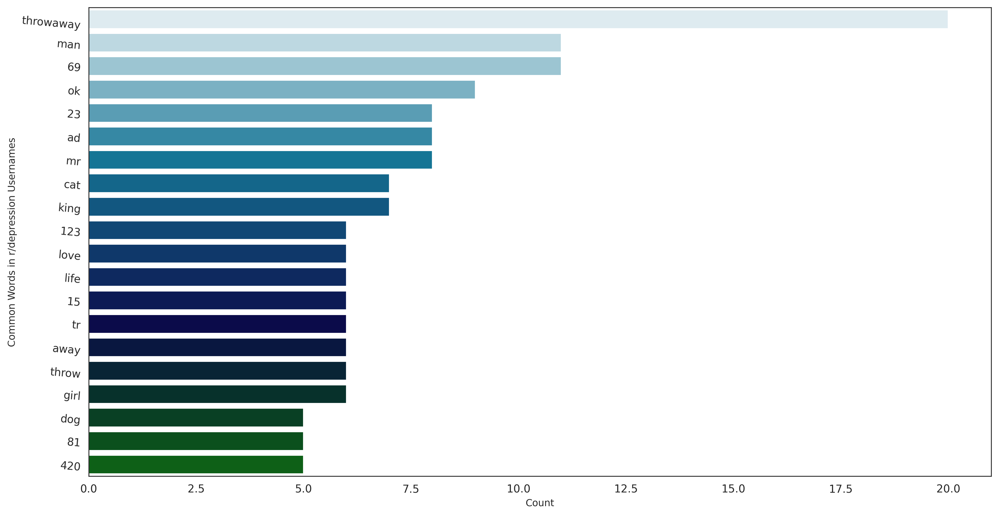

In [47]:
plot_most_used_words("r/depression Usernames", depression_authors, palette="ocean_r", image_mask="./assets/depression_mask.png")

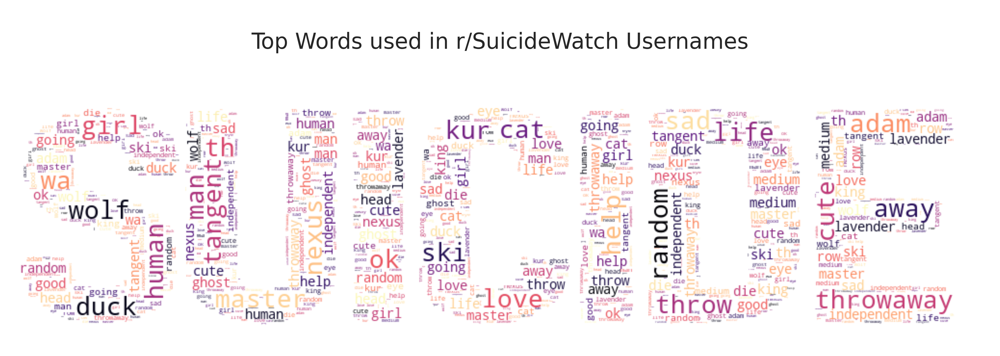

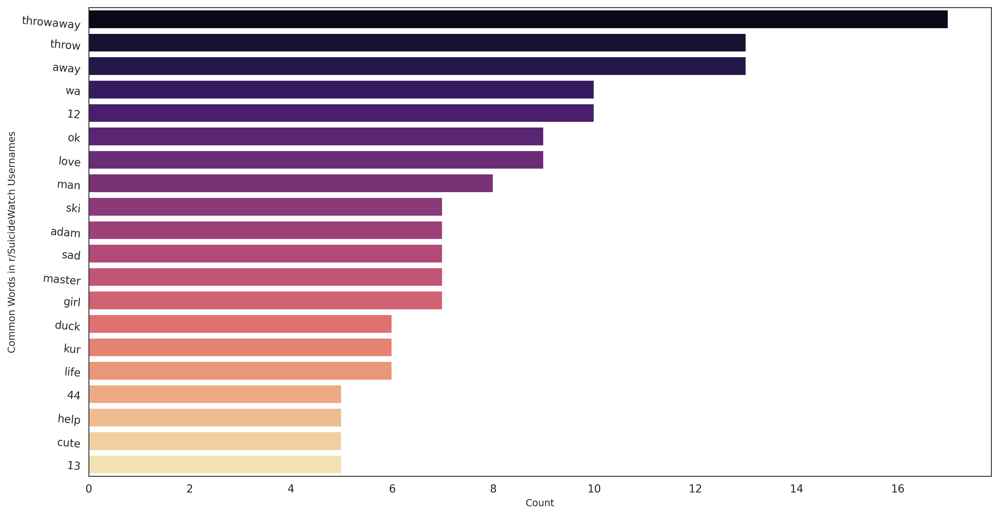

In [48]:
plot_most_used_words("r/SuicideWatch Usernames", suicide_authors, palette="magma", image_mask="./assets/suicide_mask.png")

In [49]:
#since the most frequent word in usernames is throwaway, checking it's frequency
combined_data["author_clean"].str.contains("throwaway").sum()

37

## Length of Posts

In [65]:
combined_data['selftext_length'] = [len(combined_data['selftext'][i]) for i in range(len(combined_data))]

In [66]:
combined_data['title_length'] = [len(combined_data['title'][i]) for i in range(len(combined_data))]

In [67]:
avg_length_depression_title = combined_data['title_length'][combined_data['is_suicide'] == 0].mean()
avg_length_depression_posts = combined_data['selftext_length'][combined_data['is_suicide'] == 0].mean()
avg_length_suicide_title = combined_data['title_length'][combined_data['is_suicide'] == 1].mean()
avg_length_suicide_posts = combined_data['selftext_length'][combined_data['is_suicide'] == 1].mean()

In [68]:
print("Average length of a r/depression title: {}".format(avg_length_depression_title))
print("Average length of a r/SuicideWatch title: {}".format(avg_length_suicide_title))
print("Average length of a r/depression post: {}".format(avg_length_depression_posts))
print("Average length of a r/SuicideWatch post: {}".format(avg_length_suicide_posts))

Average length of a r/depression title: 40.488821138211385
Average length of a r/SuicideWatch title: 38.96334012219959
Average length of a r/depression post: 878.1168699186992
Average length of a r/SuicideWatch post: 748.724032586558


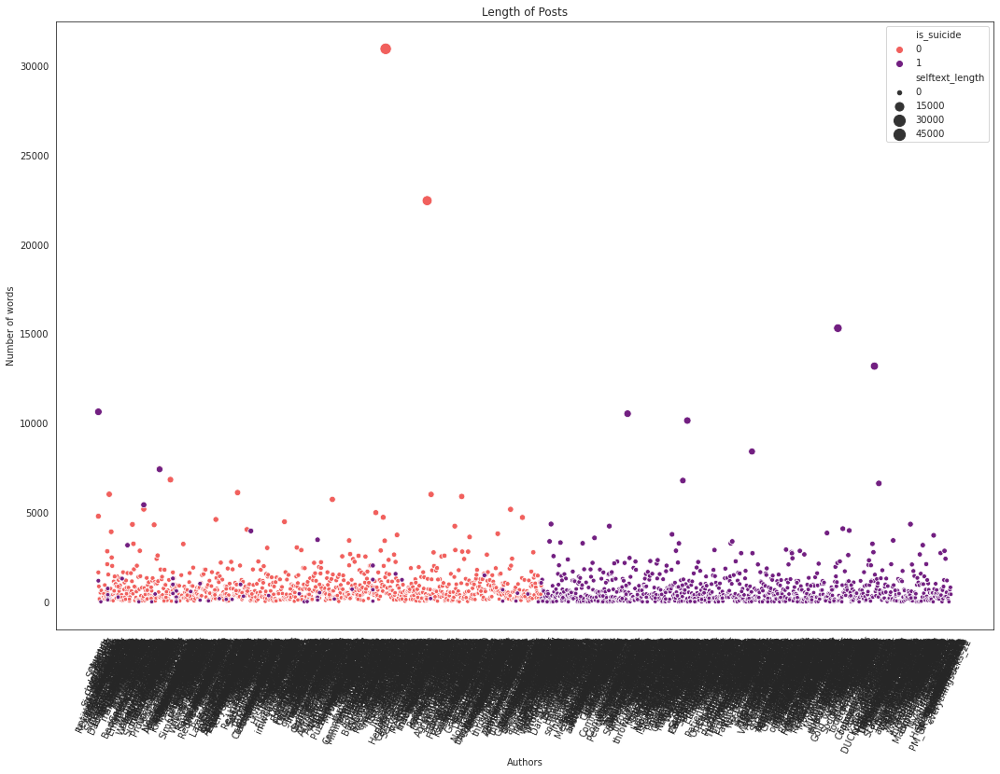

In [69]:
#CREATING A SCATTERPLOT TO VISUALISE LENGTH OF POSTS
sns.set_style("white")
plt.figure(figsize = (18, 12))
sns.scatterplot(data =combined_data,
               y = "selftext_length", 
               x = "author",
               hue = 'is_suicide', 
               palette = "magma_r",
               size = 'selftext_length',
               sizes=(20, 150));
plt.title("Length of Posts");
plt.xlabel("Authors");
plt.ylabel("Number of words");
plt.xticks(rotation=65);

In [78]:
#CHECKING IF OUR NEWER COLUMNS INTRODUCED MISSING DATA INTO OUR DATASET
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1966 entries, 0 to 1965
Data columns (total 12 columns):
title              1966 non-null object
selftext           1966 non-null object
author             1966 non-null object
num_comments       1966 non-null int64
is_suicide         1966 non-null int64
url                1966 non-null object
selftext_clean     1966 non-null object
title_clean        1966 non-null object
author_clean       1966 non-null object
selftext_length    1966 non-null int64
title_length       1966 non-null int64
megatext_clean     1966 non-null object
dtypes: int64(4), object(8)
memory usage: 184.4+ KB


In [79]:
#SAVING combined_data
combined_data.to_csv('./data/data_for_model.csv', index = False)